# IMA207 - Practical work on SAR statistics

### Emanuele DALSASSO, Florence TUPIN, Cristiano ULONDU MENDES, Thomas BULTINGAIRE

### Statistics and despeckling

The practical work is divided in 3 parts

- A. empirical checking of the distributions seen in course for synthetic speckle
- B. computation of equivalent number of looks using images of physically homogeneous areas
- C. spatial multi-looking and implementation of the Lee filter

You have at your disposal several images of various areas acquired by different acquisition modes.
- An oceanfront in São-Paulo acquired by Sentinel-1 sensor (ESA) in GRD (Ground Range Detected) mode
- A farmland near from Bologne (Italy) acquired by TerraSAR-X sensor (ESA) in MGD (Multi Look Ground Range Detected) mode
- An area near from Rome acquired by TerraSAR-X sensor (ESA) in SLC (Single Look Complex) mode
- A temporal stack of images acquired at Flevoland in Netherlands by Alos sensor (JAXA) in SLC mode

Some useful functions are available in the file *mvalab.py*.

### Name: ANDRE Noa

#### Instructions

To solve this practical session, answer the questions below. Then export the notebook with the answers using the menu option **File -> Download as -> Notebook (.ipynb)**. Then [submit the resulting file on e-campus by next week.

### Import the libraries and packages we are going to use
The following cell imports all that is going to be necessary for the practical work

In [11]:
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py

--2025-05-20 14:24:32--  https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 2a04:8ec0:0:a::89c2:16e3, 137.194.22.227
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|2a04:8ec0:0:a::89c2:16e3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68071 (66K) [text/x-python]
Saving to: 'mvalab.py.1'

     0K .......... .......... .......... .......... .......... 75% 9,08M 0s
    50K .......... ......                                     100%  105M=0,006s

2025-05-20 14:24:32 (11,7 MB/s) - 'mvalab.py.1' saved [68071/68071]



In [12]:
import scipy
from scipy import signal
import scipy.signal
import scipy as spy
import scipy.fftpack
from scipy import ndimage
from scipy import special
from scipy import ndimage
import numpy as np
import math
import matplotlib.pyplot as plt
import mvalab as mvalab
from urllib.request import urlopen
import cmath

plt.rcParams['figure.figsize'] = [15, 15]
plt.rcParams['figure.max_open_warning'] = 30

## A. Single look data distributions

In this part, we will simulate an SLC (Single Look Complex) SAR image representing an homogeneous area and analyze the pdfs of its intensity and phase.

#### Single look data simulation

According to the Goodman model, the real and imaginary parts of each pixel of an SLC SAR image are independent and identically distributed according to a Gaussian distribution centered and of variance equal to the reflectivity of the pixel divided by 2.\
Choose randomly a reflectity value $R$ in the interval $[100, 200]$ and create a SLC SAR image of size $150\times 150$ representing an homogeneous area of reflectivity $R$.

Affichage d'une image reelle
plt.show dans visusar : image 150 x 150


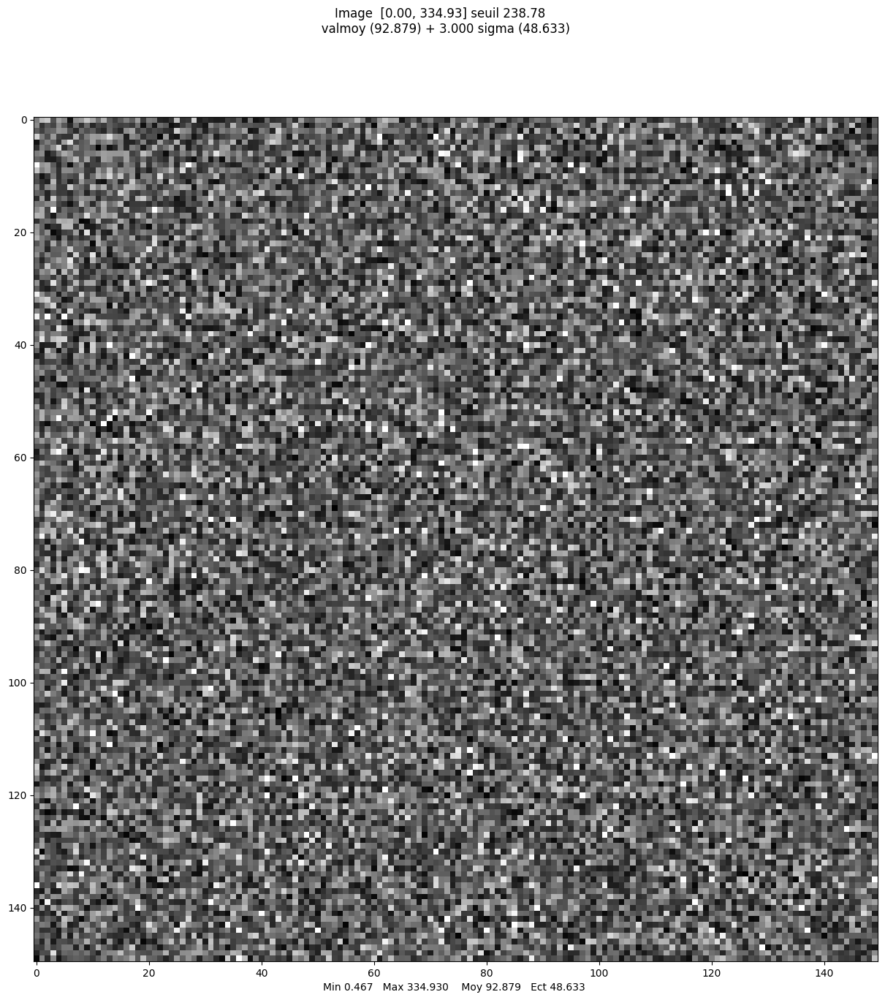

array([[119.05472893, 175.86262317, 188.6492167 , ...,  75.56504943,
          4.00811332,  80.55727199],
       [129.33937798,  47.12686997,  81.03096747, ...,  60.17436484,
         17.45503795,  79.367588  ],
       [ 87.33141478,  60.79308222,  93.44157806, ...,  67.14092585,
         64.84911802, 114.6610011 ],
       ...,
       [ 61.45697277,  56.94811272, 108.47655799, ..., 102.61518042,
         27.65816872,  20.24337388],
       [ 34.82033415,  73.86623172,  71.14755585, ...,  27.96787993,
         75.67325008, 133.32818983],
       [  7.30211676, 124.05916713,  38.27729078, ...,  99.63168552,
         54.89607772, 177.97008647]])

In [13]:
# Chose the reflectivity of the homogeneous area
R = 150 #complete

# Simulate the corresponding SLC image
ima_slc = np.random.normal(0, R/2, size=[150, 150]) + 1j * np.random.normal(0, R/2, size=[150, 150]) #complete
mvalab.visusar(np.abs(ima_slc))

#### Data distributions for an homogeneous area

compute the distribution of the phase and intensity of your image.
Then, estimate the coefficient of variation:  
$\gamma=\frac{\sigma}{\mu}$ using intensity data (square of the modulus of the complex field)

In [14]:
# Compute the intensity and the phase
ima_int = np.abs(ima_slc)**2 #complete
ima_ph = np.angle(ima_slc) #complete

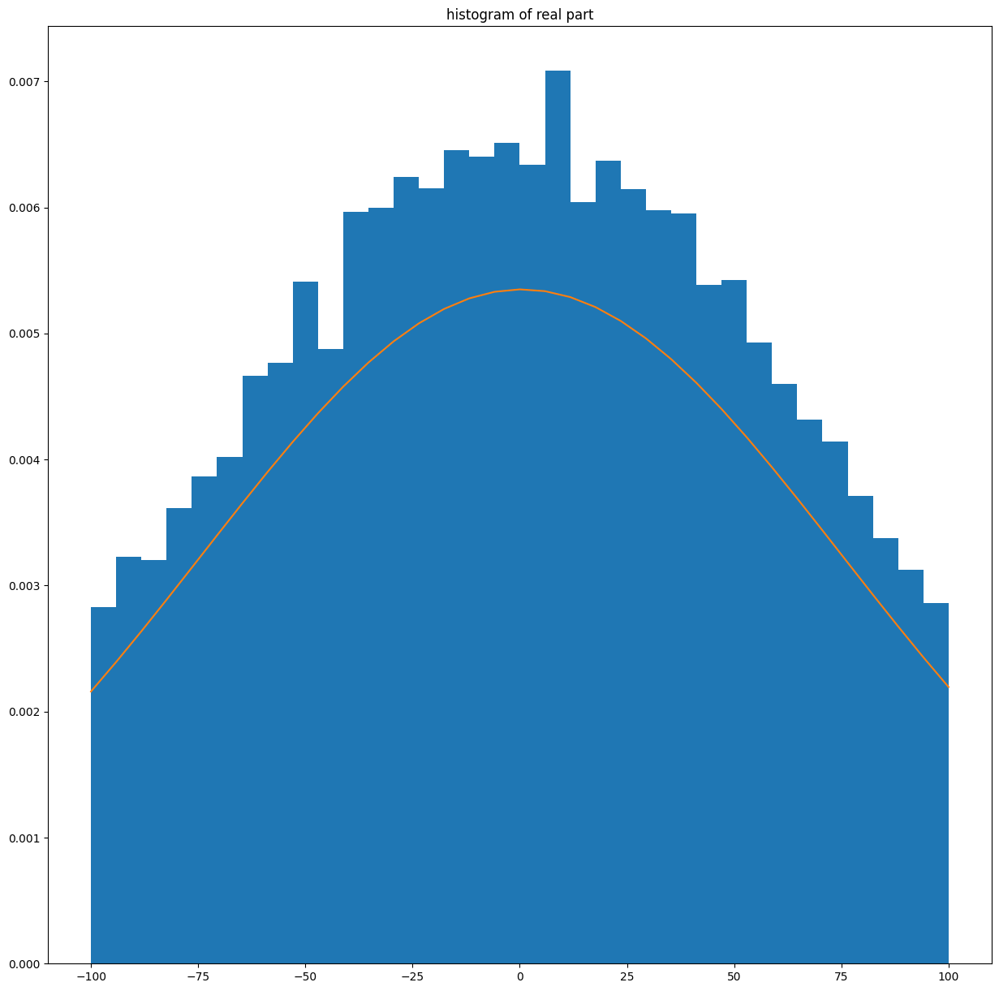

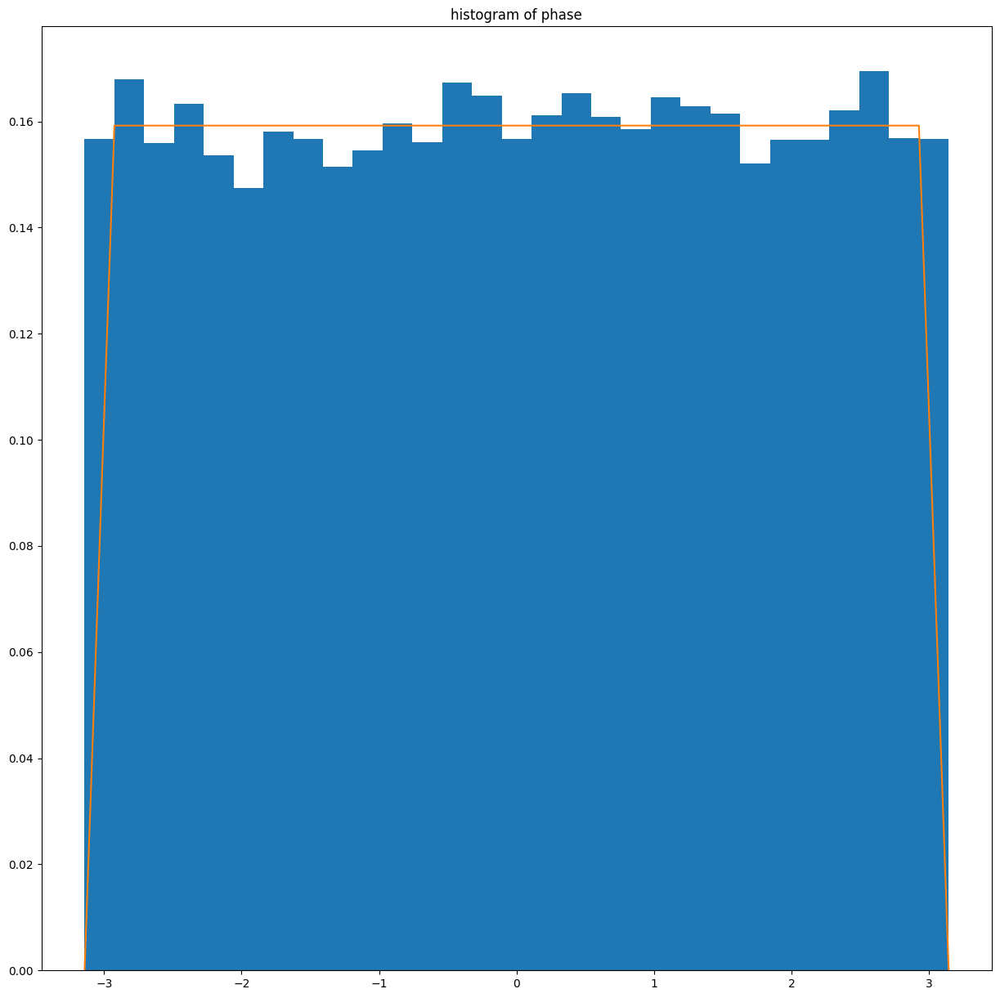

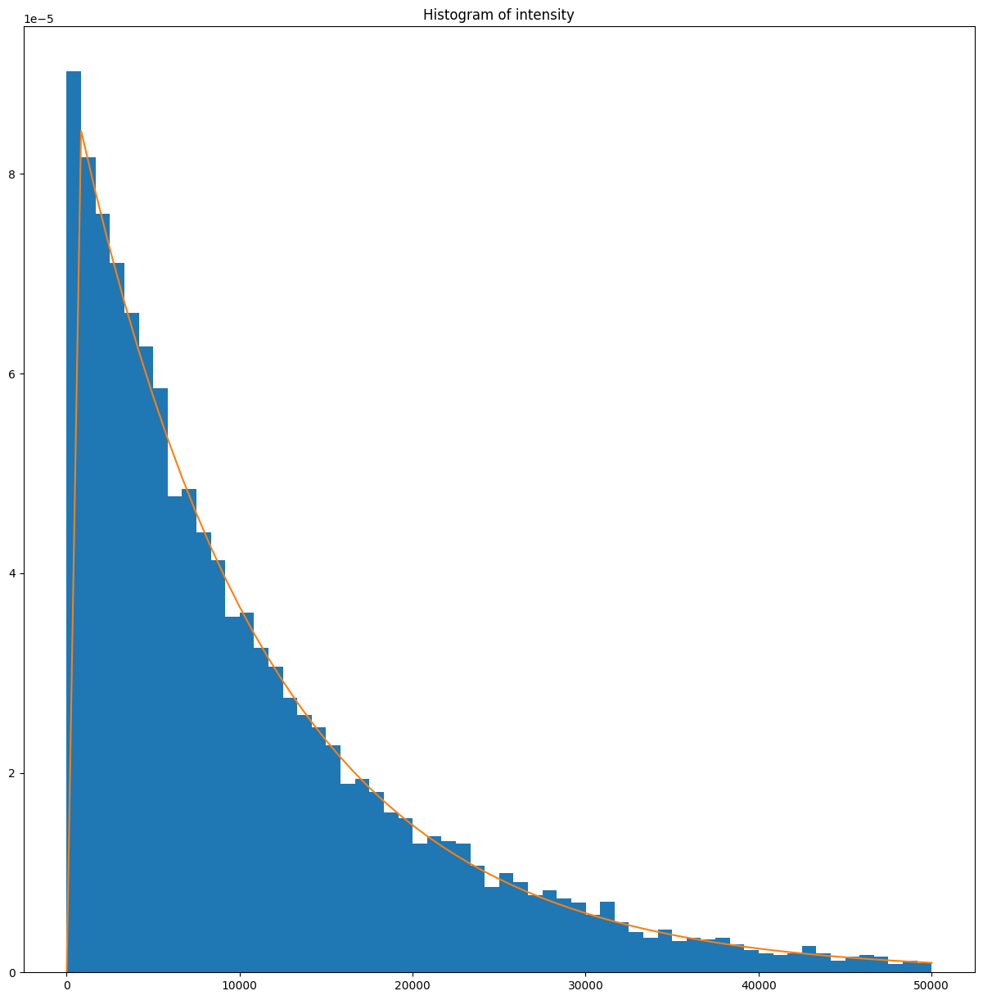

In [15]:
# Plot the histograms and verify they match the theoretical distribution
# Use the right range of values to plot the histogram
# Choose the right distribution to do the fitting

# fitting of the distributions
# use the following ones :
# Uniform pdf : scipy.stats.uniform
# Rayleigh pdf : scipy.stats.rayleigh
# Exponential pdf : scipy.stats.expon

#example for real part of the data
plt.figure()
_, bins, _ = plt.hist(np.real(ima_slc).ravel(),bins='auto',density=True,range=[-100,100])  # Gaussian distribution
mu, sigma = scipy.stats.norm.fit(np.real(ima_slc))
best_fit_line = scipy.stats.norm.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line)
plt.title('histogram of real part')
plt.show()


#complete for phase data: Uniform distribution
plt.figure()
_, bins, _ = plt.hist(ima_ph.ravel(),bins='auto',density=True,range=[-np.pi,np.pi]) 
mu, sigma = scipy.stats.uniform.fit(ima_ph)
best_fit_line = scipy.stats.uniform.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line)
plt.title('histogram of phase')
plt.show()


#complete for intensity data: Exponential (Gamma) distribution
plt.figure()
_, bins, _ = plt.hist(ima_int.ravel(), bins='auto', density=True, range=[0, np.percentile(ima_int, 99)])
loc, scale = scipy.stats.expon.fit(ima_int)
best_fit_line = scipy.stats.expon.pdf(bins, loc=loc, scale=scale)
plt.plot(bins, best_fit_line)
plt.title('Histogram of intensity')
plt.show()


In [16]:
# Compute the coefficient of variation on the homogeneous area in intensity

ima_int_homogeneous = ima_int[:150,  :150]
# ima_int_homogeneous = ima_int
m_I = np.mean(ima_int_homogeneous) #complete
sigma_I = np.std(ima_int_homogeneous) #complete
coeff_var_I = sigma_I/m_I
print(coeff_var_I)

0.9960693008201611


### Question A.1.

Did you find the distributions seen in the course ? (recapitulate them).
Did you find the correct value for the coefficient of variation ? Could this coefficient be less than the theoretical value ?

### Answer A.1.

Yes, the distributions observed are similar to those discussed in the course. Specifically, the intensity follows an exponential distribution, and the phase is uniformly distributed for an image that follows a normal distribution. The coefficient of variation is 1, as expected for an exponential distribution. This coefficient could be less than the theoretical value in a non-homogeneous part of the image.

## B. Computation of the Equivalent Number of looks on homogeneous areas
In this part you have at your disposal 2 images of a part a ocean (São-Paulo) and a part of a field (Bologne, Italy). The first is acquired by Sentinel-1 GRD, and the second by TerraSAR-X GRD. The multi-looking has been done by the data provider (ESA, European Space Agency).

Use the value of the coefficient of variation to find the Equivalent Number of Looks (ENL) of the Sentinel-1 GRD and TerraSAR-X GRD data.
The formula is :
- $\gamma_I=\frac{1}{\sqrt{L}}$ for intensity data

In [17]:
# Download the images
!wget "https://partage.imt.fr/index.php/s/7RfHSqLgTfn2Mx6/download/amplitude_Sao-Paulo_S1_SM_GRD.npy"
!wget "https://partage.imt.fr/index.php/s/fosXSfBSPzygzRX/download/amplitude_Bologne_TSX_SM_MGD.npy"

--2025-05-20 14:24:33--  https://partage.imt.fr/index.php/s/7RfHSqLgTfn2Mx6/download/amplitude_Sao-Paulo_S1_SM_GRD.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4194432 (4,0M) [application/octet-stream]
Saving to: 'amplitude_Sao-Paulo_S1_SM_GRD.npy.1'

     0K .......... .......... .......... .......... ..........  1% 3,47M 1s
    50K .......... .......... .......... .......... ..........  2% 4,22M 1s
   100K .......... .......... .......... .......... ..........  3% 4,76M 1s
   150K .......... .......... .......... .......... ..........  4% 4,71M 1s
   200K .......... .......... .......... .......... ..........  6% 5,60M 1s
   250K .......... .......... .......... .......... ..........  7% 4,09M 1s
   300K .......... .......... .......... .......... ..........  8% 4,61M 1s
   350K .......... .......... .......... .......... ..........  

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


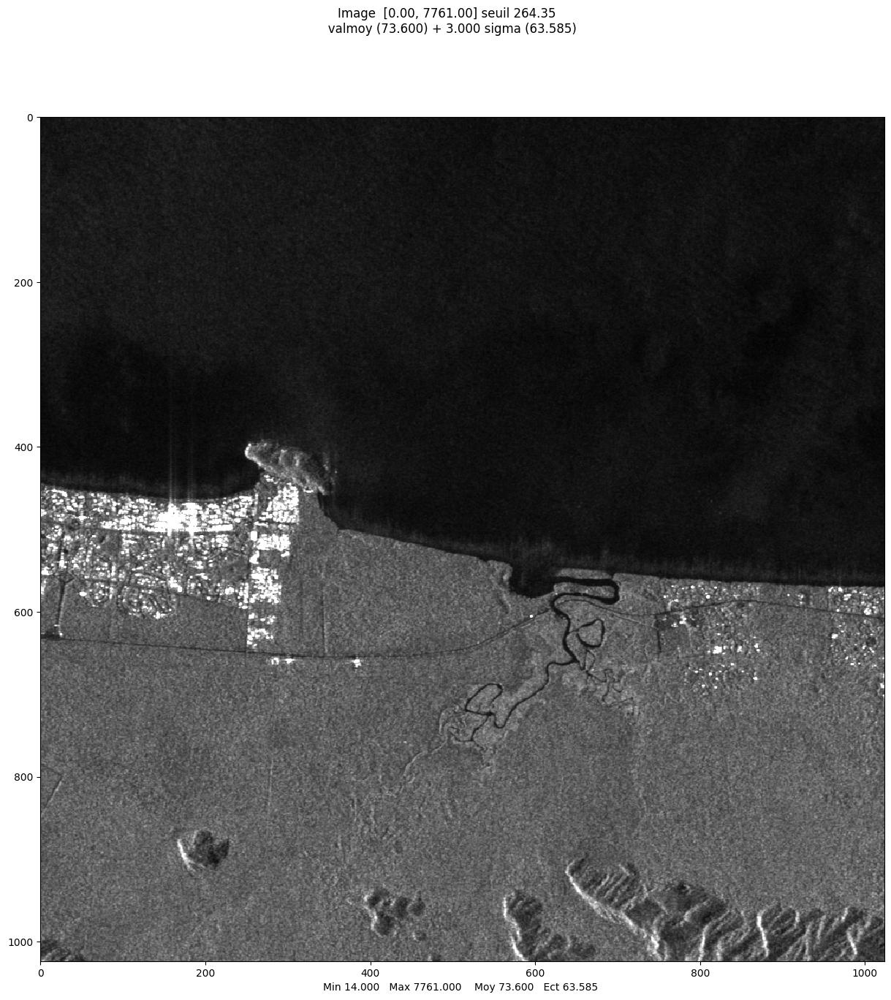

Affichage d'une image reelle
plt.show dans visusar : image 194 x 161


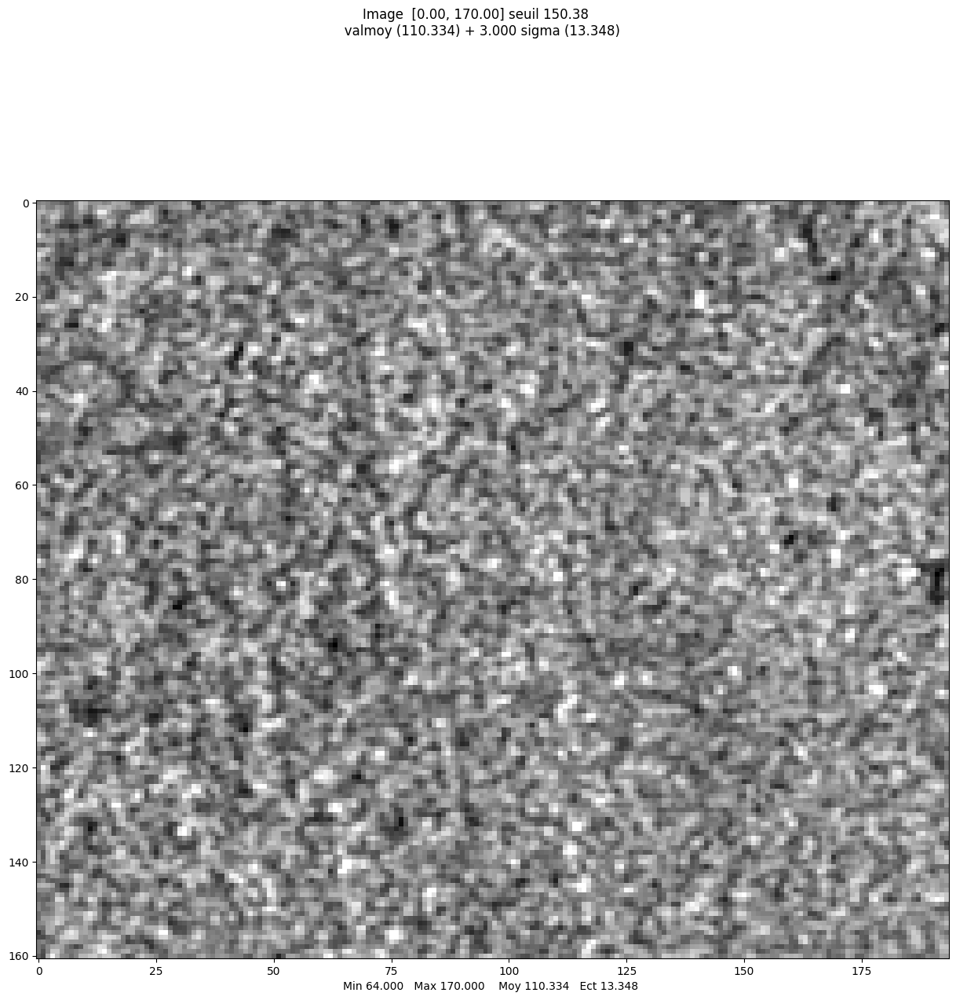

--- coeff var and L ---
0.24286821
16.953472


In [18]:
amp_s1grd = np.load("amplitude_Sao-Paulo_S1_SM_GRD.npy") #amplitude
amp_s1grd_coast = amp_s1grd[745:906, 762:956]
mvalab.visusar(amp_s1grd)
mvalab.visusar(amp_s1grd_coast)

# compute coefficient of variation and number of looks
int_s1grd = amp_s1grd_coast**2 #complete
coeff_var_s1grd = np.std(int_s1grd)/np.mean(int_s1grd) #complete
L_s1grd = 1/(coeff_var_s1grd**2) #complete
print('--- coeff var and L ---')
print(coeff_var_s1grd)
print(L_s1grd)

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


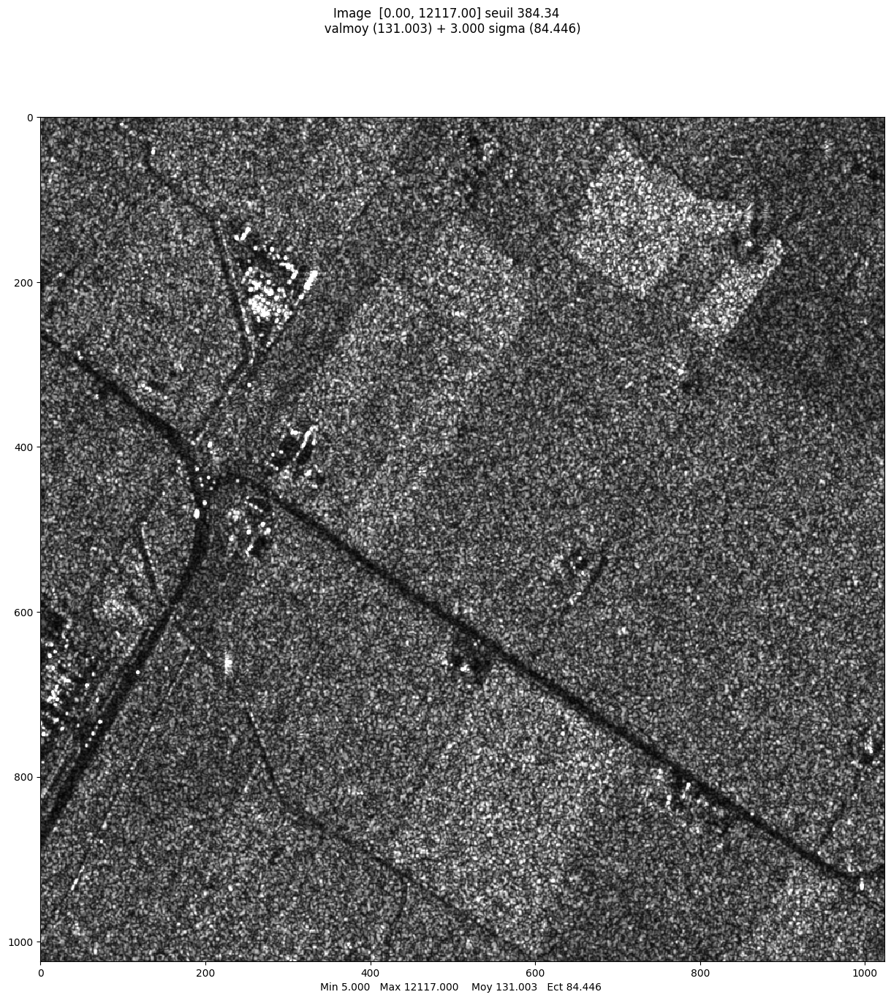

Affichage d'une image reelle
plt.show dans visusar : image 258 x 314


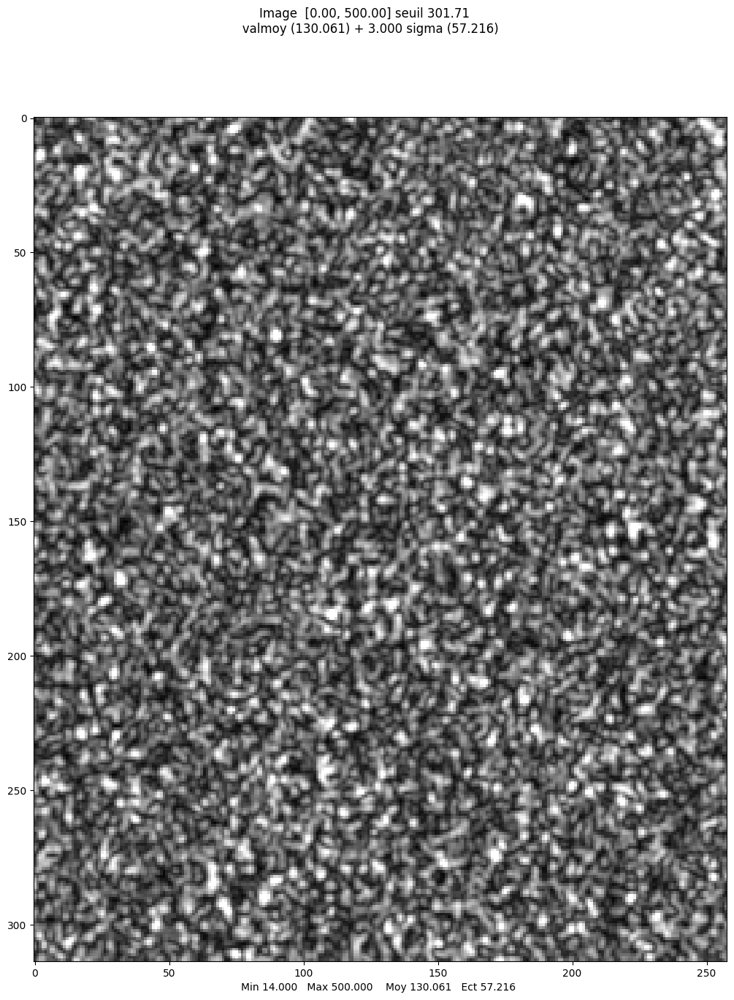

--- coeff var and L ---
0.90132064
1.2309527


In [19]:
amp_tsxgrd = np.load("amplitude_Bologne_TSX_SM_MGD.npy") #amplitude
amp_tsxgrd_field = amp_tsxgrd[411:725, 766:1083]
mvalab.visusar(amp_tsxgrd)
mvalab.visusar(amp_tsxgrd_field)

# compute coefficient of variation and number of looks
int_tsxgrd = amp_tsxgrd_field**2 #complete
coeff_var_tsxgrd = np.std(int_tsxgrd)/np.mean(int_tsxgrd) #complete
L_tsxgrd = 1/(coeff_var_tsxgrd**2) #complete
print('--- coeff var and L ---')
print(coeff_var_tsxgrd)
print(L_tsxgrd)

### Question B.1
Comment the number of looks you have found for GRD date from Sentinel-1 and TerraSAR-X (is it an integer value ? why not ? what does it mean ?).

### Answer B.1

For the coastal SAR image (16.9 looks), the higher number of looks suggests less speckle noise and better signal averaging, indicating more reliable data. For the field SAR image (1.23 looks), the lower number indicates more speckle noise and fewer independent observations, making the data less reliable.

The non-integer values for the number of looks reflect the spatial averaging used in the calculation, which can lead to fractional results based on the coefficient of variation.

The coastal area likely has a more stable surface, while the field has more terrain variability, both of which affect the noise levels in the images.

### Question B.2
Comment the number of looks you find for a Single Look Complex (SLC) image from TerraSAR-X satellite. Does it seem that this image comes from a spatial average of pixels?

In [20]:
# Download the image
!wget "https://partage.imt.fr/index.php/s/N2Rk79o8tx6Ntyg/download/complex_Rome_TSX_SM_SSC.npy"

--2025-05-20 14:24:37--  https://partage.imt.fr/index.php/s/N2Rk79o8tx6Ntyg/download/complex_Rome_TSX_SM_SSC.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8388736 (8,0M) [application/octet-stream]
Saving to: 'complex_Rome_TSX_SM_SSC.npy.1'

     0K .......... .......... .......... .......... ..........  0% 10,6M 1s
    50K .......... .......... .......... .......... ..........  1% 4,62M 1s
   100K .......... .......... .......... .......... ..........  1% 5,73M 1s
   150K .......... .......... .......... .......... ..........  2% 4,76M 1s
   200K .......... .......... .......... .......... ..........  3% 4,50M 1s
   250K .......... .......... .......... .......... ..........  3% 3,67M 2s
   300K .......... .......... .......... .......... ..........  4% 5,35M 2s
   350K .......... .......... .......... .......... ..........  4% 17,3M 1s


Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


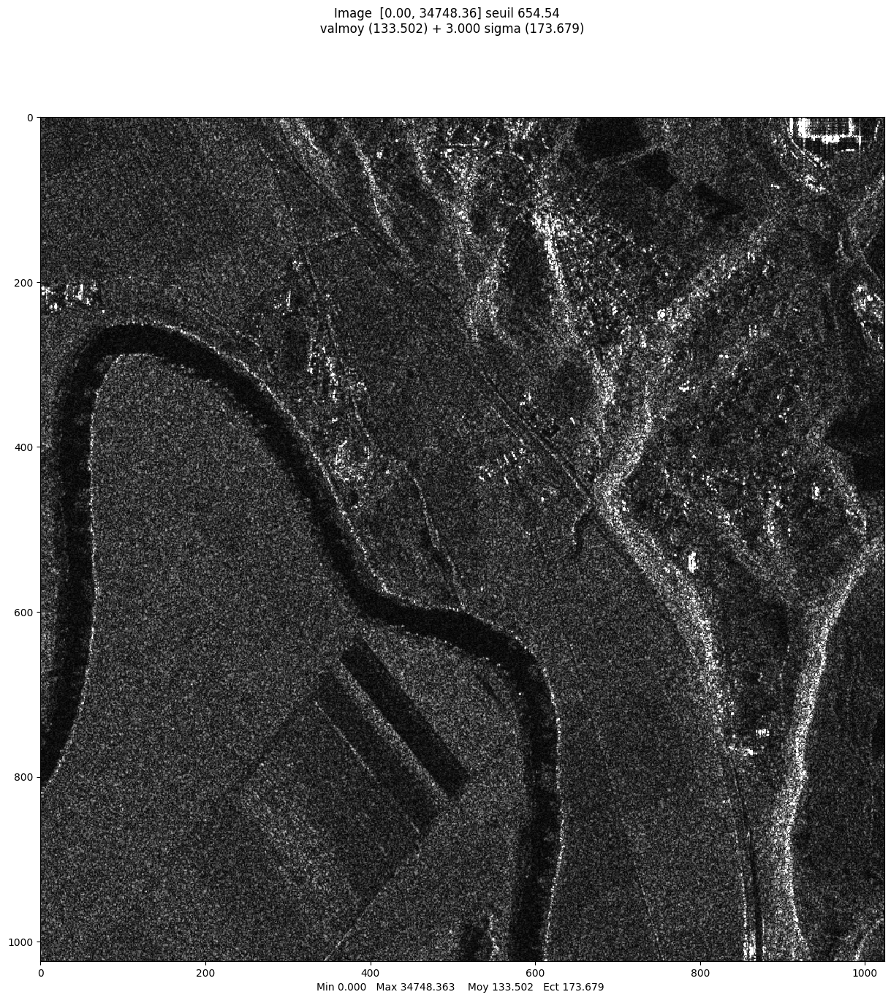

Affichage d'une image reelle
plt.show dans visusar : image 233 x 139


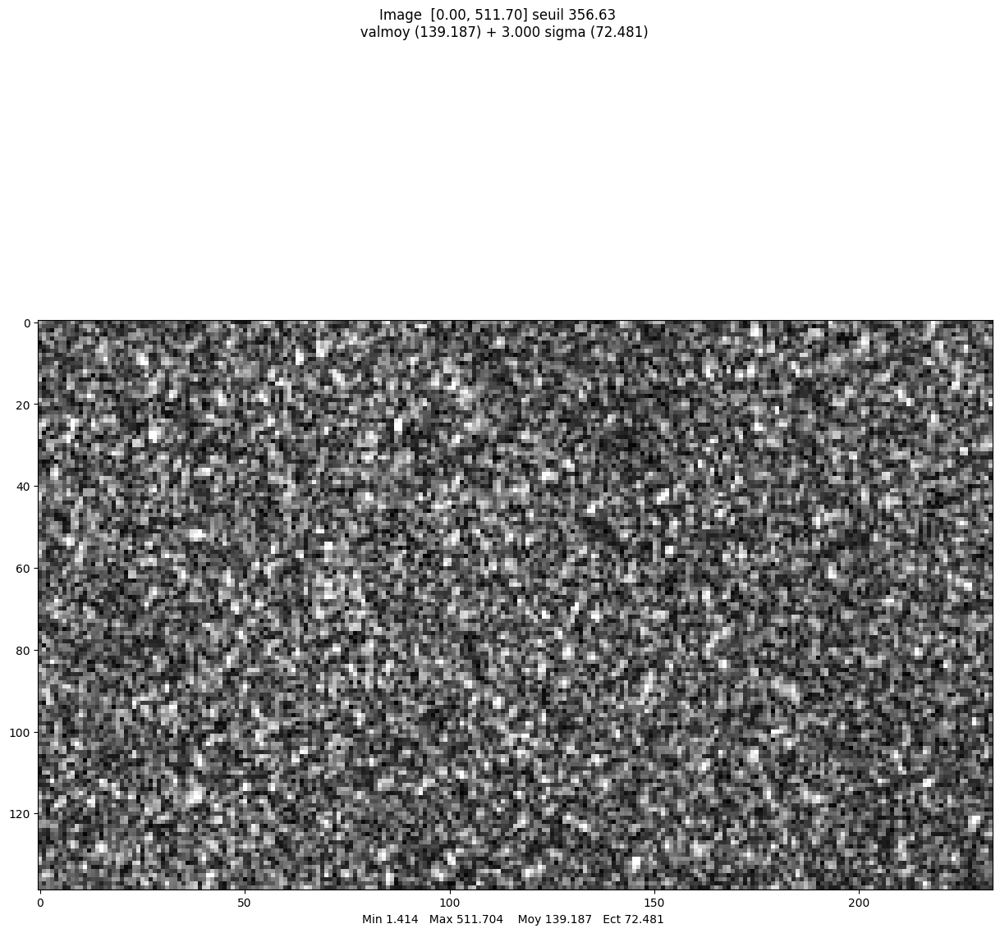

--- coeff var and L ---
0.996456
1.0071257


In [21]:
ima_tsxslc = np.load("complex_Rome_TSX_SM_SSC.npy") #complex image
amp_tsxslc = np.abs(ima_tsxslc)
amp_tsxslc_homog = amp_tsxslc[492:631, 89:322]
mvalab.visusar(amp_tsxslc)
mvalab.visusar(amp_tsxslc_homog)

# compute coefficient of variation and number of looks
int_tsxslc = amp_tsxslc_homog**2 #complete
coeff_var_tsxslc = np.std(int_tsxslc)/np.mean(int_tsxslc) #complete
L_tsxslc = 1/(coeff_var_tsxslc**2) #complete
print('--- coeff var and L ---')
print(coeff_var_tsxslc)
print(L_tsxslc)


### Answer B.2

The SLC image does not seem like a spatial averaging. We get a number of look close to 1 in an homogeneous part, indicating minimal averaging of the pixels.

## C. Spatial multi-looking and implementation of the Lee filter

In this part we will try simple speckle reduction method using the following step :
- first we will compute a mean filter
- then we will compute the local coefficient of variation (using the same size for the moving window)
- finally we will combine these two results to obtain the Lee filter.

## C.1 Computation of the mean filter
Compute the mean filter using a 2D convolution of the Rome Single Look Complex (SLC) image ("ima_tsxslc").

Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 1024 x 1024


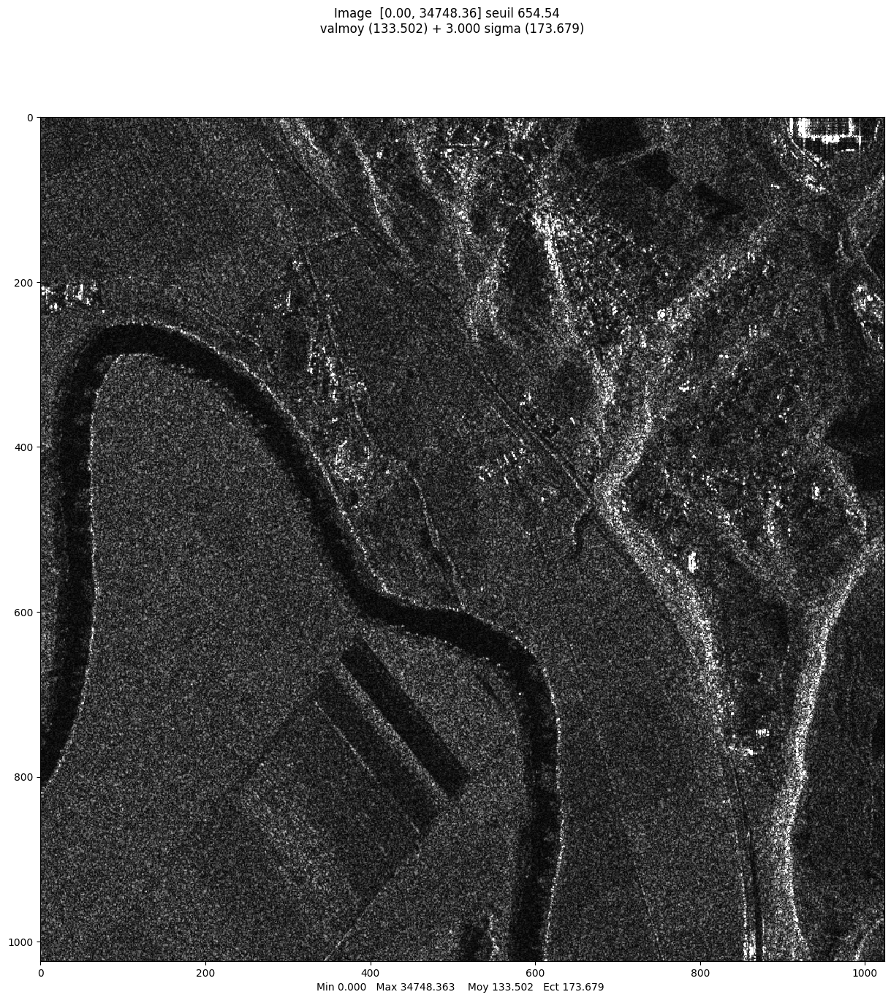

Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 1024 x 1024


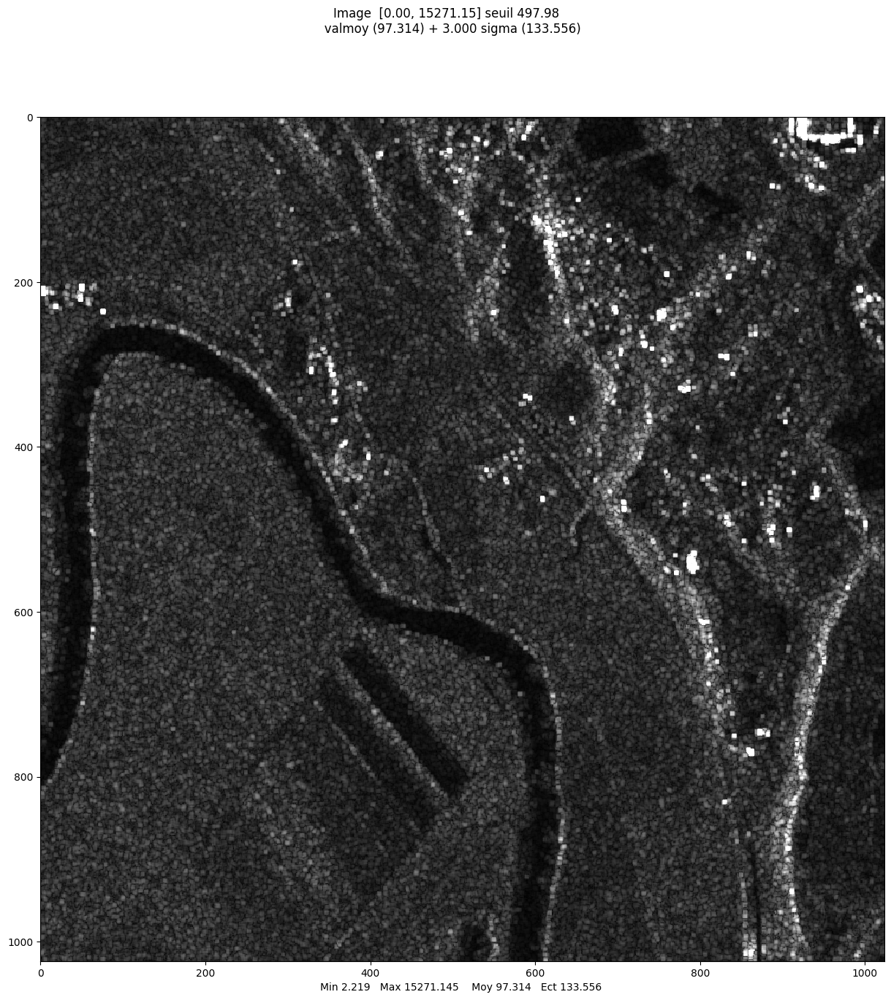

array([[ 60.94984421,  70.45414145,  67.80023966, ..., 109.077058  ,
         90.07492824,  51.08314977],
       [ 76.10665432,  91.77900508,  98.98480659, ..., 111.82005789,
         84.2647578 ,  45.69924708],
       [ 90.86358127, 105.05038765, 115.10334689, ..., 110.58846437,
         81.52532645,  50.25043017],
       ...,
       [ 80.85415414,  69.75824998,  52.24099333, ...,  32.41895885,
         31.81266961,  37.41412042],
       [ 76.36740714,  67.55379919,  49.85256467, ...,  34.45048736,
         34.46911246,  34.55155903],
       [ 71.63336267,  62.51989793,  59.03736981, ...,  35.43536374,
         35.97857272,  28.3644326 ]])

In [29]:
# take the intensity
ima_int = ima_tsxslc**2 #complete
mvalab.visusar(ima_tsxslc)

# create the average window
size_window = 5
mask_loc = np.ones((size_window, size_window))/(size_window**2) #complete

# compute the mean image (intensity data)
ima_int_mean = scipy.signal.convolve2d(ima_int, mask_loc, mode='same') #complete

# display the result
mvalab.visusar(np.sqrt(ima_int_mean))

### Question C.1
What is the effect of the mean filter ? (advantages and drawbacks). What is the influence of the window size ?

### Answer C.1

The image is less noisy after the mean filter but seems blurrier. The bigger the window size, the less details remains in the image. It takes an average on more pixels.

## C.2 Lee filter

Given a neighborhood, the Lee filter of an image $I_s$ can be computed by the following steps:

*   Compute the local mean of the image $\hat{\mu}_{s}$ (convolution by some mean filtering for the given neighborhood).
*   Compute the local variance of the image and the local (empirical) coefficient of variation $\hat{\gamma}_s$ for the given neighborhood.
*   Compute $k_s$ given by:
$$
  k_s=1- \frac{\gamma_{Sp}^2}{\hat{\gamma}_s^2}
$$
where $\gamma_{Sp}$ is the theoretical value of the coefficient of variation for a pure speckle ($\gamma_{Sp}=\frac{1}{\sqrt{L}}$ for a L-look intensity image).
*   Compute the final filtered image
$$
  \hat{I}_s= \hat{\mu}_{s}+k_s (I_s-\hat{\mu}_{s})
$$

Create a function performing Lee filter on an image, for a given neighborhood and number $L$ of look.

Then, knowing that a SLC image is a 1-look complex image, compute the Lee filter on the intensity image of "ima_tsxslc".

Displaying locally averaged image.
Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 1024 x 1024


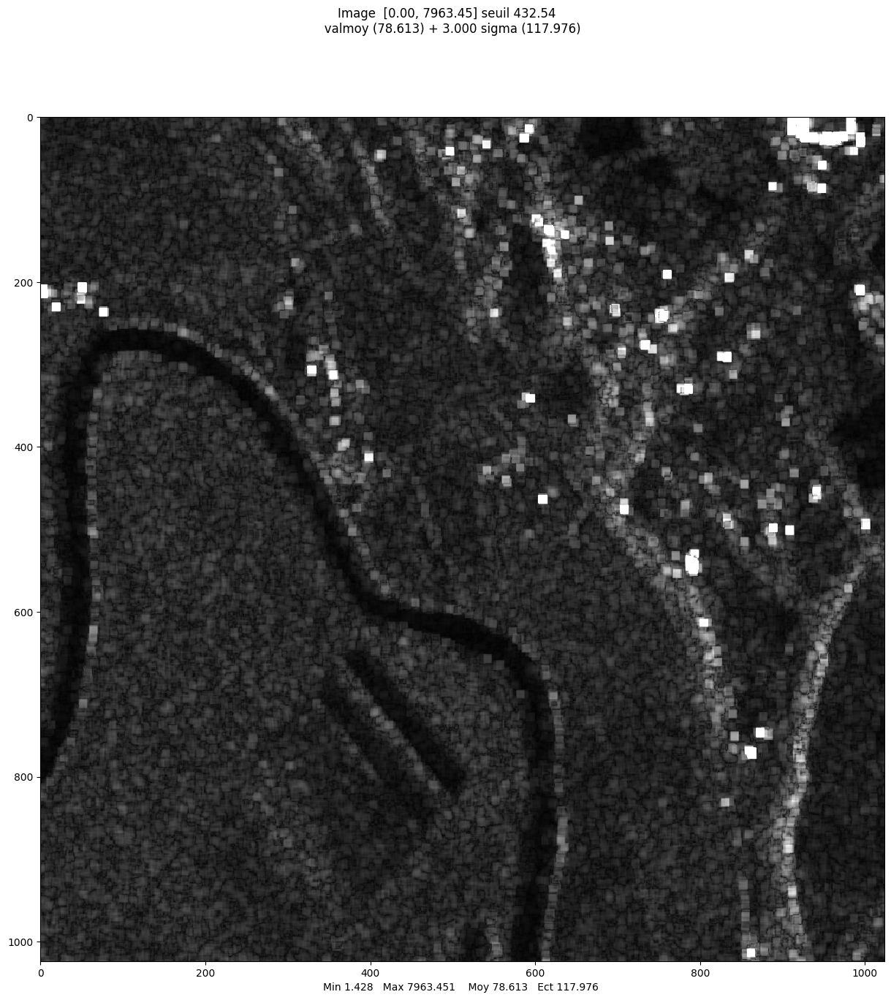

Displaying (square root of) local standard deviation. Square root is applied so the displayed image is not completely dark.
Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 1024 x 1024


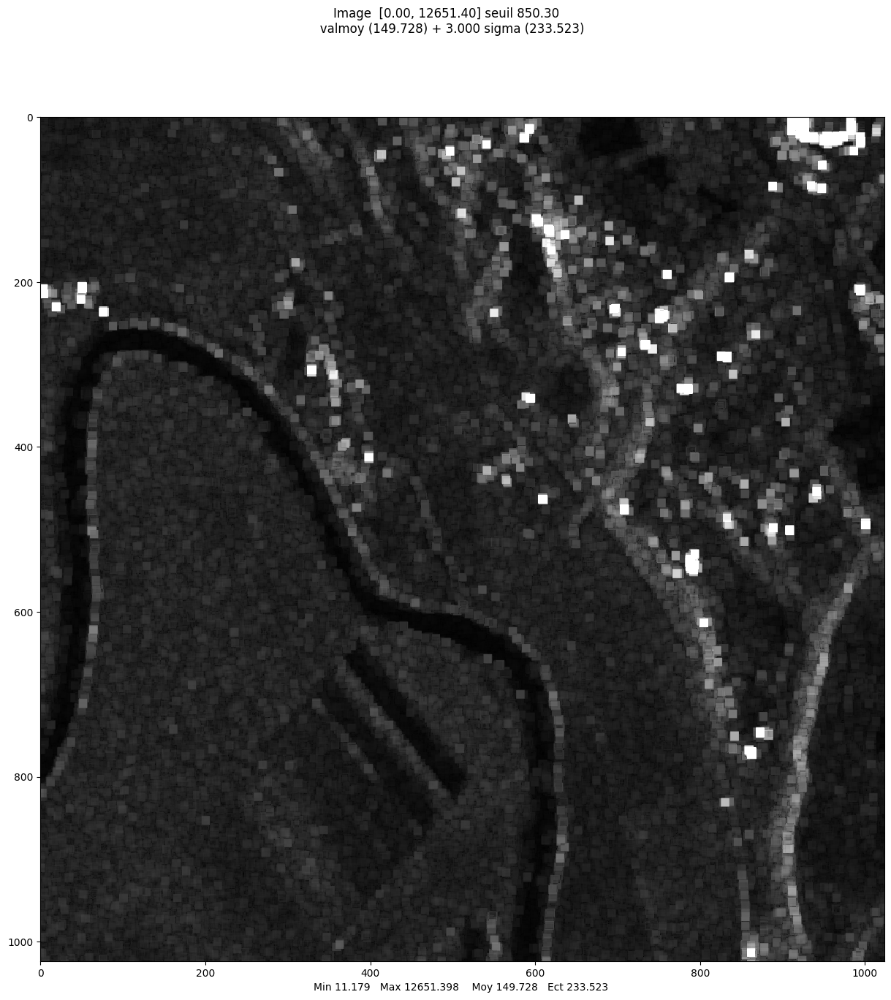

Displaying local coefficient of variation.
Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 1024 x 1024


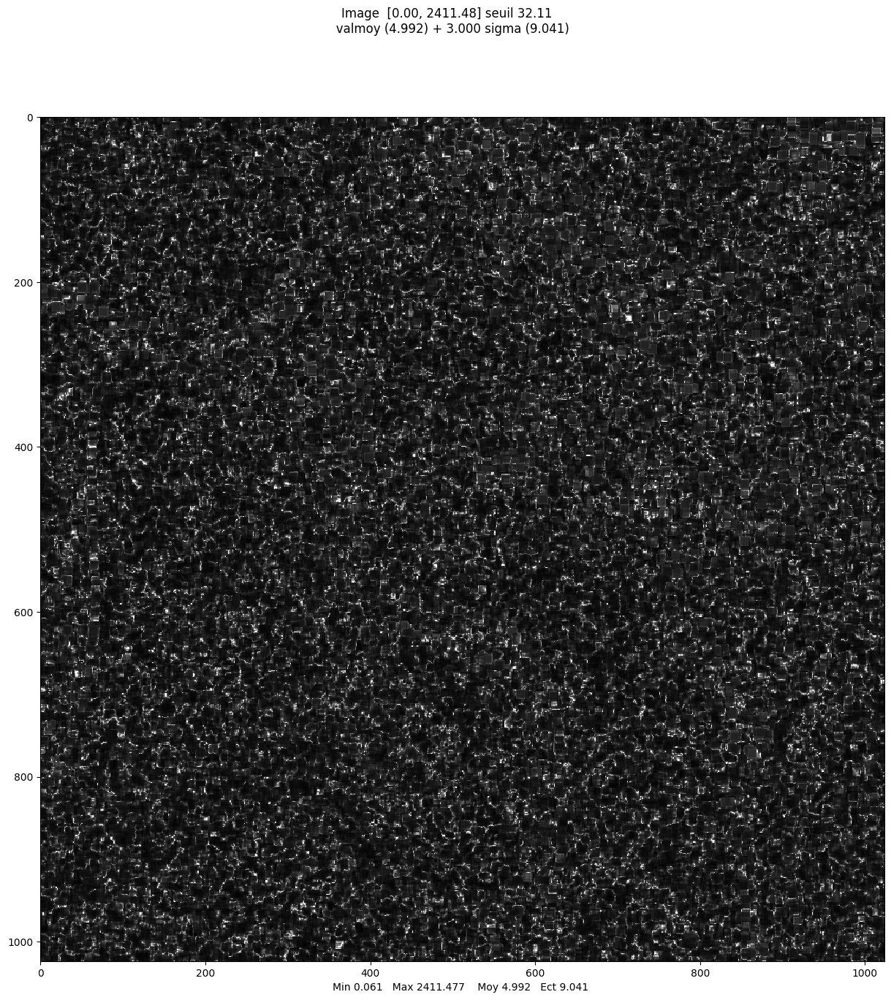

Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 1024 x 1024


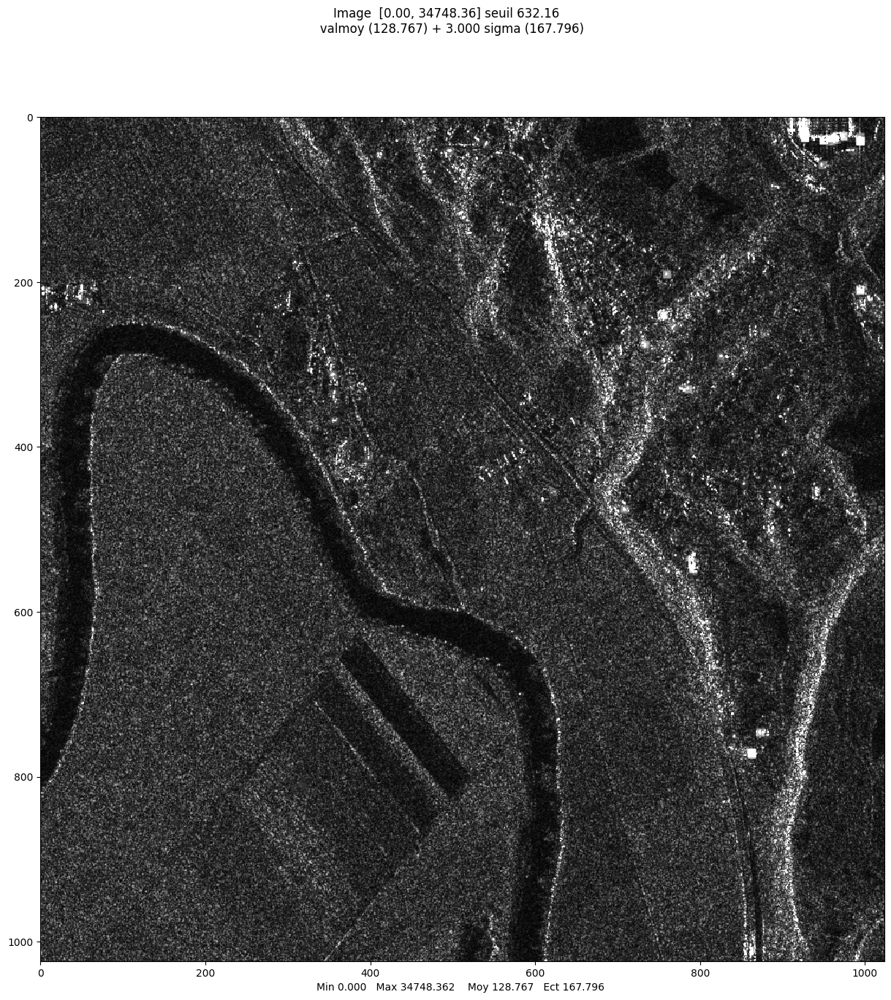

array([[ 42.42640687, 144.36758639, 132.87964479, ..., 100.17824057,
         94.82681362, 205.14890875],
       [ 54.03702434,  40.60788101, 155.38983236, ...,  18.35755975,
        101.17806086, 194.72440792],
       [157.56268594, 133.41664064, 152.97058541, ..., 211.12318679,
        152.26621424,  44.52159118],
       ...,
       [121.61669884, 182.44866243, 104.23497175, ...,  77.25715538,
         82.35987629, 126.07827853],
       [198.56485087,  30.89868887, 110.86849483, ...,  56.40035461,
         30.59411708,  52.73555621],
       [ 64.84597135, 114.74217757,  78.03016148, ...,  10.54205744,
         52.39805554,  32.47359008]])

In [34]:
def lee_filter(im_int, neighborhood=7, L=1, visualize=False):

  # Mask
  kernel = np.ones((neighborhood, neighborhood)) / (neighborhood**2) #complete

  # Compute local mean image
  im_int_mean = signal.convolve2d(im_int, kernel, mode='same', boundary='symm') #complete

  # Compute local coefficient of variation (thanks to local variance and local mean)
  local_2nd_order_moment_int = signal.convolve2d(im_int**2, kernel, mode='same', boundary='symm') #complete: variance = (2nd order momentum) - mean^2
  local_var_int = local_2nd_order_moment_int - im_int_mean**2 #complete
  local_coeff_var_int = np.sqrt(local_var_int) / (im_int_mean + 1e-8) #complete
  local_ks = 1 - L/local_coeff_var_int #complete
  local_ks = np.clip(local_ks, 0, 1)

  # Compute Lee filter
  filtered_im_int = im_int_mean + local_ks*(im_int - im_int_mean) #complete

  # Visualizations
  if visualize:
    print("Displaying locally averaged image.")
    mvalab.visusar(np.sqrt(im_int_mean))
    print("Displaying (square root of) local standard deviation. Square root is applied so the displayed image is not completely dark.")
    mvalab.visusar(np.sqrt(local_var_int)**(1/2))
    print("Displaying local coefficient of variation.")
    mvalab.visusar(local_coeff_var_int)

  return filtered_im_int


lee_filtered_int = lee_filter(ima_int, neighborhood=10, L=1, visualize=True) #complete
mvalab.visusar(np.sqrt(lee_filtered_int))

### Question C.2
Which information is enhanced in the image of the local standard deviation ? In the image of the local coefficient of variation ? Which one is the more useful ?

### Answer C.2

The image of local standart deviation highlights the local variation in the image like edges and textures. The local coefficient of variation normalize this measure by dividing by the local mean. It is then more robust to brithness variation.

### Question C.3

Compare the results of the mean filter and the Lee filter. Study the influence of the size of the window of the filters.


### Answer C.3

As the window size increases, the image gets blurrier but the Lee filter still preserve the edges. Hence it is more effective to denoise the image without getting blur.

## C.4 Filtering of image "Lely" and comparison with a deep learning algorithm
In this part, we will repeat the process done above to denoise a crop of SLC image "Lely" using the Lee filter. Then, we will compare it with the result of a deep learning algorithm called SAR2SAR (https://arxiv.org/abs/2006.15037).

In [35]:
# Download the image
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim

--2025-05-20 15:01:16--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 2a04:8ec0:0:a::89c2:16e3, 137.194.22.227
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|2a04:8ec0:0:a::89c2:16e3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 52428800 (50M)
Saving to: 'lely_tuple_multitemp.IMA'

     0K .......... .......... .......... .......... ..........  0% 4,99M 10s
    50K .......... .......... .......... .......... ..........  0% 7,04M 9s
   100K .......... .......... .......... .......... ..........  0% 9,94M 7s
   150K .......... .......... .......... .......... ..........  0% 5,04M 8s
   200K .......... .......... .......... .......... ..........  0% 10,1M 7s
   250K .......... .......... .......... .......... ..........  0% 4,60M 8s
   300K .......... .......... .......... .......... ..........  0% 28,8M 7s
   350K ..........

imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type CFLOAT
lecture de  lely_tuple_multitemp.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 1 blocksize 2097152
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données complexes (standard). Nouvelle version de imz2mat 

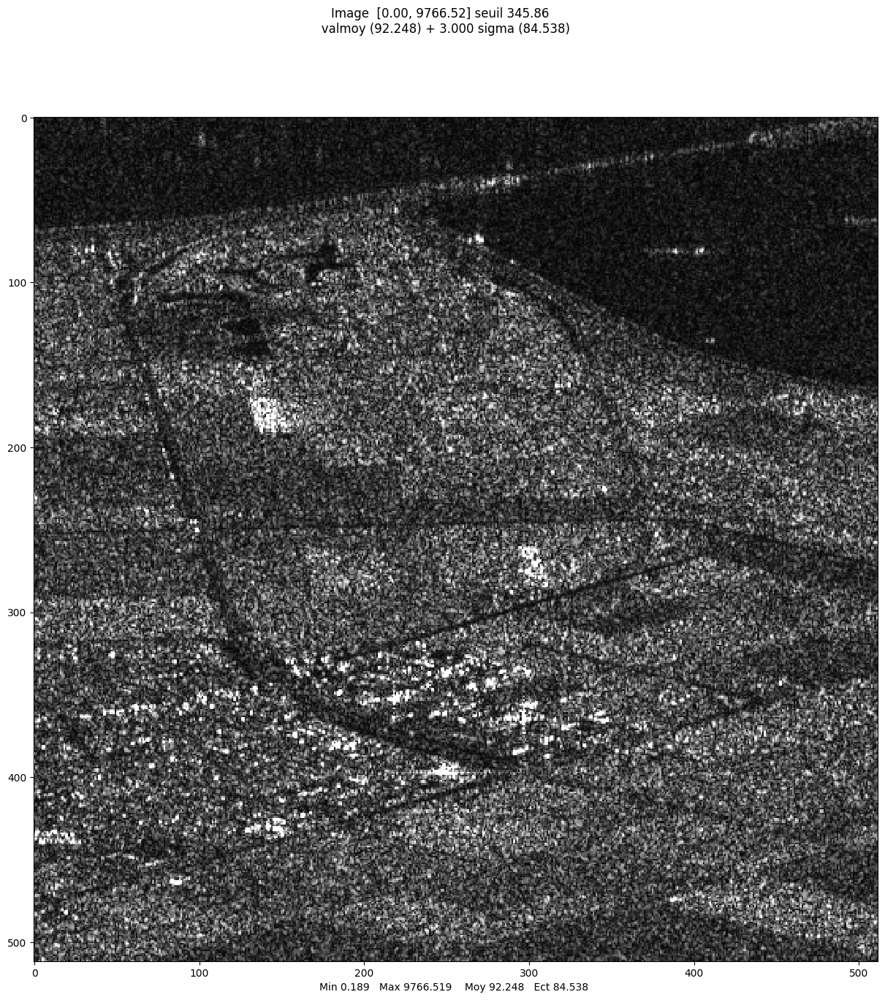

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


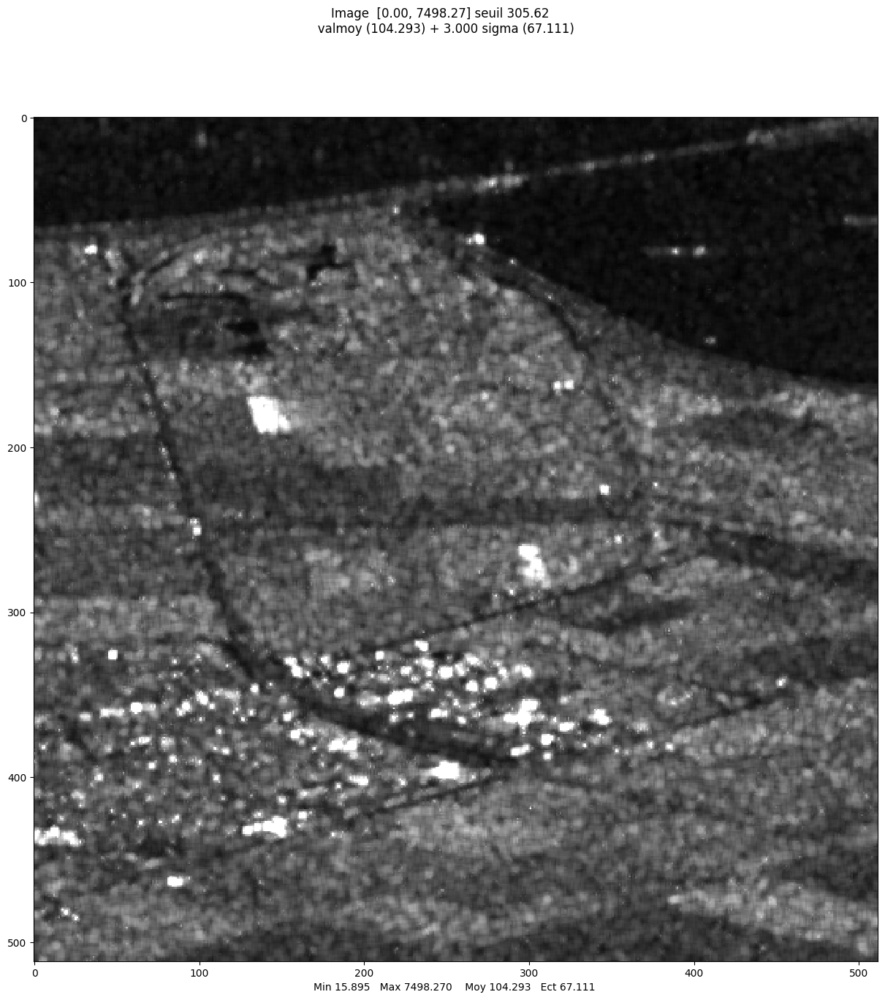

array([[ 32.59552258,  28.88963953,  27.90577843, ...,  68.10839659,
         80.10318371,  78.01034007],
       [ 34.79158827,  30.00782048,  30.2584747 , ...,  73.33449393,
         84.23078773,  79.7471642 ],
       [ 38.14826209,  35.02857221,  37.11756299, ...,  75.2869592 ,
         81.38824977,  74.9261017 ],
       ...,
       [ 79.10586012,  89.60975431, 101.52331965, ...,  95.55202273,
         82.88750843,  84.62341225],
       [ 72.99013677,  85.48220432, 104.38087176, ...,  80.18955465,
         79.17332116,  79.17054506],
       [ 59.78356265,  78.14538226,  94.62499963, ...,  79.31111502,
         83.84033458,  79.8785426 ]])

In [53]:
part_lely_slc = mvalab.imz2mat('lely_tuple_multitemp.IMA')[0] # date is on third axis of part_lely_slc
part_lely_slc = np.flip(part_lely_slc, axis=0)
# part_lely_slc is a single look complex image
lely_int = np.square(np.abs(part_lely_slc))
lely_int_t0 = lely_int[:, :, 0]
mvalab.visusar(np.sqrt(lely_int_t0)) # Visualize the amplitude of the first date of lely time series


# using your previous code, filter the image part_lely_int with the Lee filter
lee_filtered_lely_int_t0 = lee_filter(lely_int_t0, neighborhood=5, L=1, visualize=False)
mvalab.visusar(np.sqrt(lee_filtered_lely_int_t0))

### Multitemporal averaging
Instead of denoising via spatial mean filtering, one can compute a temporal averaging (mean of all available values for each pixel).

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


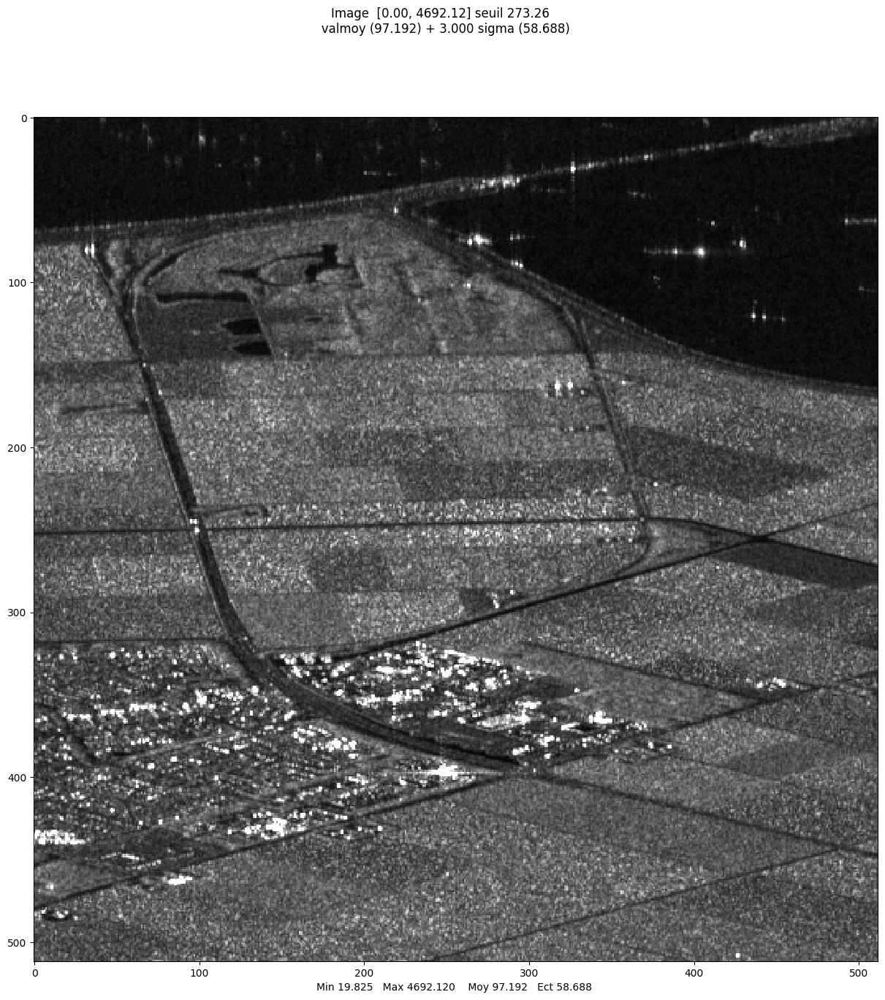

array([[ 37.5381314 ,  33.2270038 ,  33.31788255, ...,  66.90555219,
         68.78198163,  80.2940211 ],
       [ 33.66300435,  35.25326719,  32.89085551, ...,  60.6965163 ,
         74.51668525,  91.14398844],
       [ 33.08356179,  33.74922024,  41.54763708, ...,  58.69115855,
         72.67137023,  89.34587577],
       ...,
       [116.42893572, 109.71414601, 122.08662451, ...,  97.44324375,
        106.89172491,  75.18438362],
       [ 88.15264674,  98.54565572, 109.70388148, ...,  93.95691987,
        126.64880816, 117.09352385],
       [ 98.33086802,  87.97624267, 108.06294787, ..., 100.24660911,
        139.32214433, 142.11651746]])

In [45]:
lely_int_multitemp = np.mean(lely_int, axis=2) # complete
mvalab.visusar(np.sqrt(lely_int_multitemp))

### Denoised image: SAR2SAR
The Lee filter presents some limits. More recent approaches to suppress noise rely on sofisticated algorithms. You can plot the image of Lely denoised using a deep learning algorthm called SAR2SAR (in which ground changes between the aquisitions at differents times are taken into account during its training), and compare visually the result with the image filtered using the Lee filter.

--2025-05-20 15:11:28--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 2a04:8ec0:0:a::89c2:16e3, 137.194.22.227
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|2a04:8ec0:0:a::89c2:16e3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26214400 (25M)
Saving to: 'lely_tuple_multitemp_SAR2SAR.IMA.1'

     0K .......... .......... .......... .......... ..........  0% 5,41M 5s
    50K .......... .......... .......... .......... ..........  0% 3,88M 6s
   100K .......... .......... .......... .......... ..........  0% 9,76M 5s
   150K .......... .......... .......... .......... ..........  0% 6,02M 4s
   200K .......... .......... .......... .......... ..........  0% 10,2M 4s
   250K .......... .......... .......... .......... ..........  1% 3,25M 5s
   300K .......... .......... .......... .......... ..........  1% 8,6

imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp_SAR2SAR.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type FLOAT
lecture de  lely_tuple_multitemp_SAR2SAR.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 0 blocksize 1048576
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 6/25
Données réelles. Nouvell

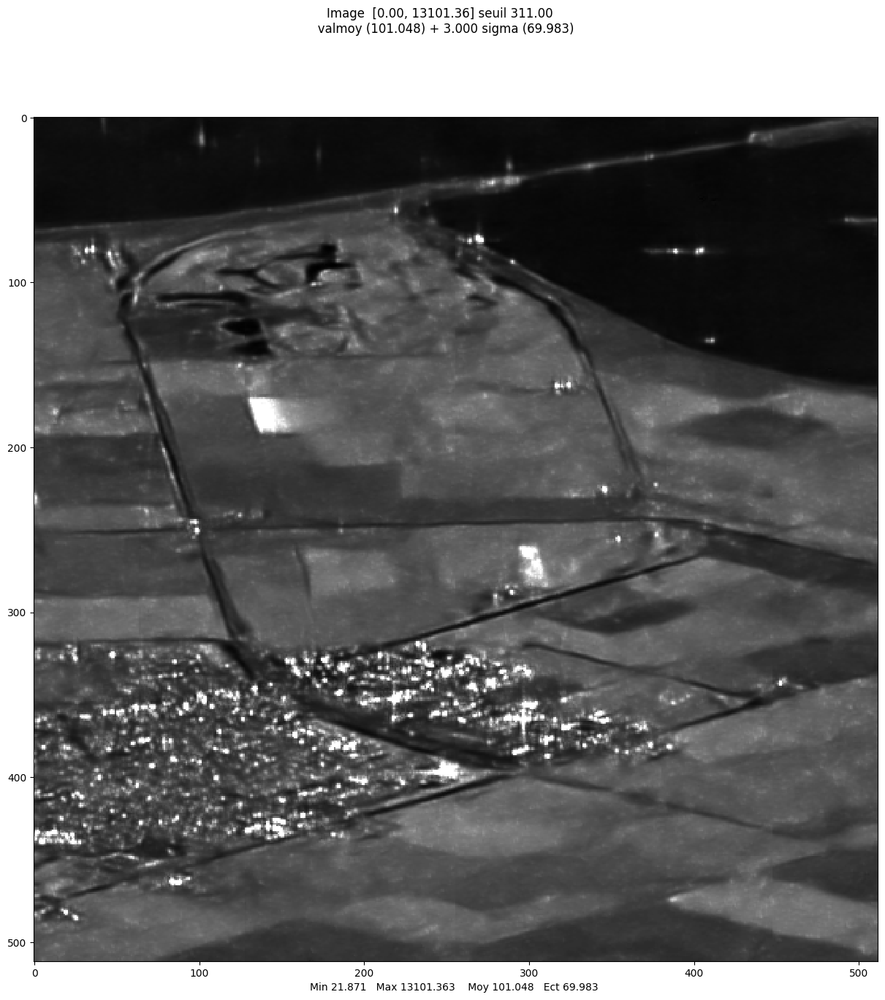

array([[ 40.69298935,  38.59126282,  38.61891174, ...,  81.21070862,
         82.10493469,  87.46295166],
       [ 39.99552917,  38.5390358 ,  38.96235657, ...,  84.42482758,
         84.06273651,  83.64545441],
       [ 40.31035233,  38.88003159,  38.09856415, ...,  82.76222992,
         81.49038696,  81.83437347],
       ...,
       [105.72384644, 114.29315186, 116.50016022, ..., 100.59217072,
        100.78230286, 100.22771454],
       [105.54544067, 111.25749207, 116.15348053, ...,  95.23865509,
         96.19988251,  95.58480072],
       [108.26735687, 108.92593384, 117.21216583, ...,  87.13925171,
         89.79171753,  89.75721741]])

In [47]:
# this image has already been processed by a CNN based filter
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
amp_den_sar2sar = mvalab.imz2mat('lely_tuple_multitemp_SAR2SAR.IMA')
amp_den_sar2sar = np.abs(amp_den_sar2sar[0][:,:,0]) #amplitude
amp_den_sar2sar = np.flip(amp_den_sar2sar, axis=0)
mvalab.visusar(amp_den_sar2sar)

### Question C.4
Do a comparison between the CNN filtering and the Lee filter. Comment the two results. Are homogeneous areas well restored? Do the methods preserve edges and fine structures? Are artifacts introduced?

### Answer C.4

The result of the Lee filter shows some ability to preserve edges, but overall it does not denoise the image very effectively. Homogeneous areas such as fields are difficult to distinguish clearly, and the image appears quite blurry. Although features like the road and city structures remain recognizable, the overall clarity is limited.

In contrast, the CNN filtering produces a much clearer and sharper image. It effectively restores homogeneous regions while preserving edges and fine details, resulting in better visual separation of different areas. 


## C.5 Residual noise
Performances of a denoising algorithm can be visually interpreted by looking at the *residual noise* (i.e. the ratio between the noisy image and the denoised image, in intensity). For a quantitative evaluation, we can look at the noise statistics, knowing that, in intensity, statistics of speckle S are:
- $\mu_S=1$
- $\sigma^2_S = \frac{1}{L}$

### Question C.5
Compute the aforementioned ratio image (with the intensity of the acquisition time 0 "lely_int_t0"), its mean value and variance for the image restored using the Lee filter, the temporal average and the result of SAR2SAR. Comment the results.

What is the interest of computing the residual noise? Why is the residual noise of the temporal averaging not homogeneous at all? What are your conclusions for the lee filter and the CNN filter?

### Answer C.5

Computing the residual noise lets us evaluate how well a denoising method performs. Visualizing it reveals any artifacts introduced by the filtering.

The residual noise from temporal averaging is very inhomogeneous because the scene can change between acquisitions. Also, different types of areas (fields, city, water) bring different variability, which explains the high variance of residual noise. Moreover, temporal averaging tends to overestimate pixel intensities.

The Lee filter, being a local adaptive method, reduces noise but struggles to fully restore homogeneous areas without blurring edges. The residual noise remains quite significant and spatially variable. Because it smooths the image, the variance of residual noise is smaller (0.66), indicating some loss of image quality.

The CNN-based SAR2SAR filter offers superior noise reduction, better preservation of edges and fine details, and a more uniform residual noise. We also see that the mean and variance of the residual noise are closer to 1, which is the ideal value. This shows its ability to model complex noise patterns and adapt spatially to the image content.

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


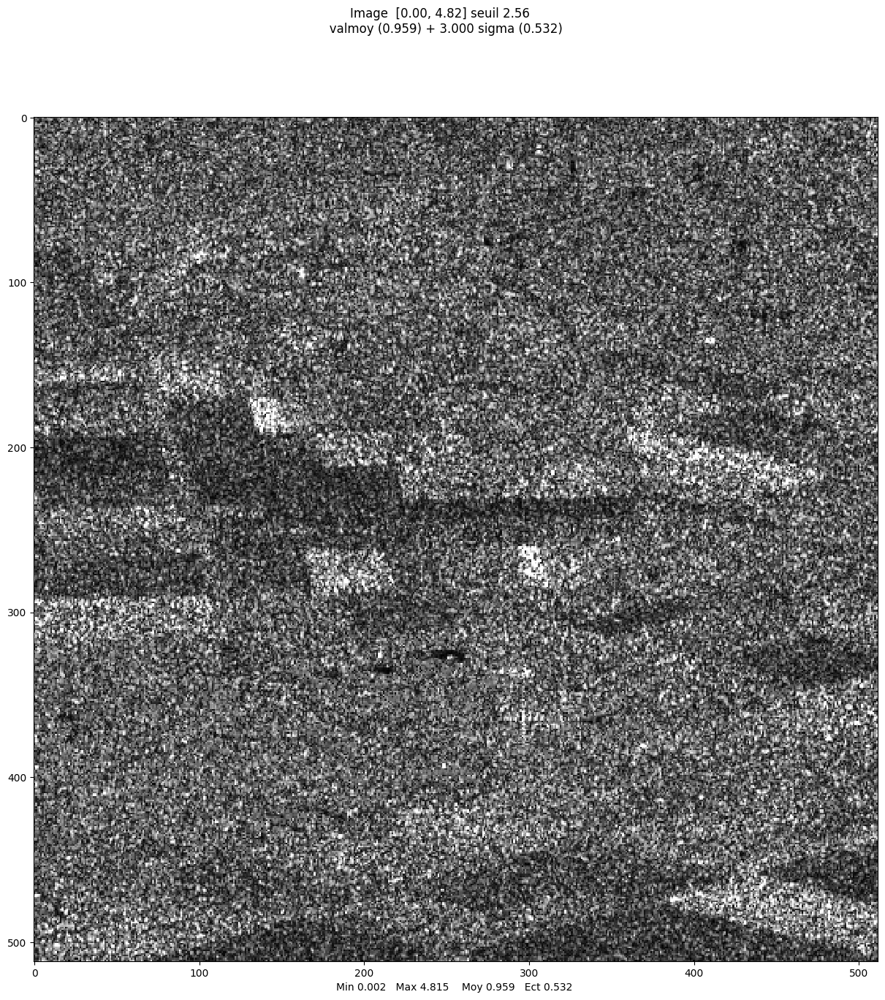

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


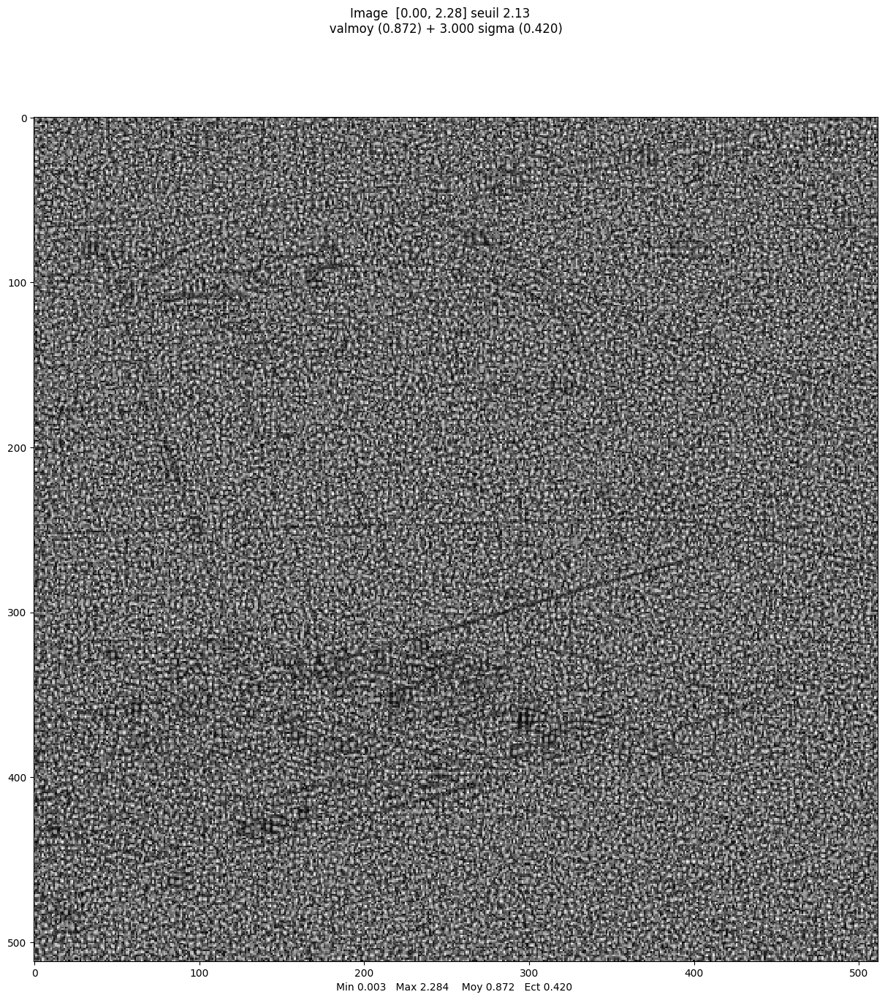

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


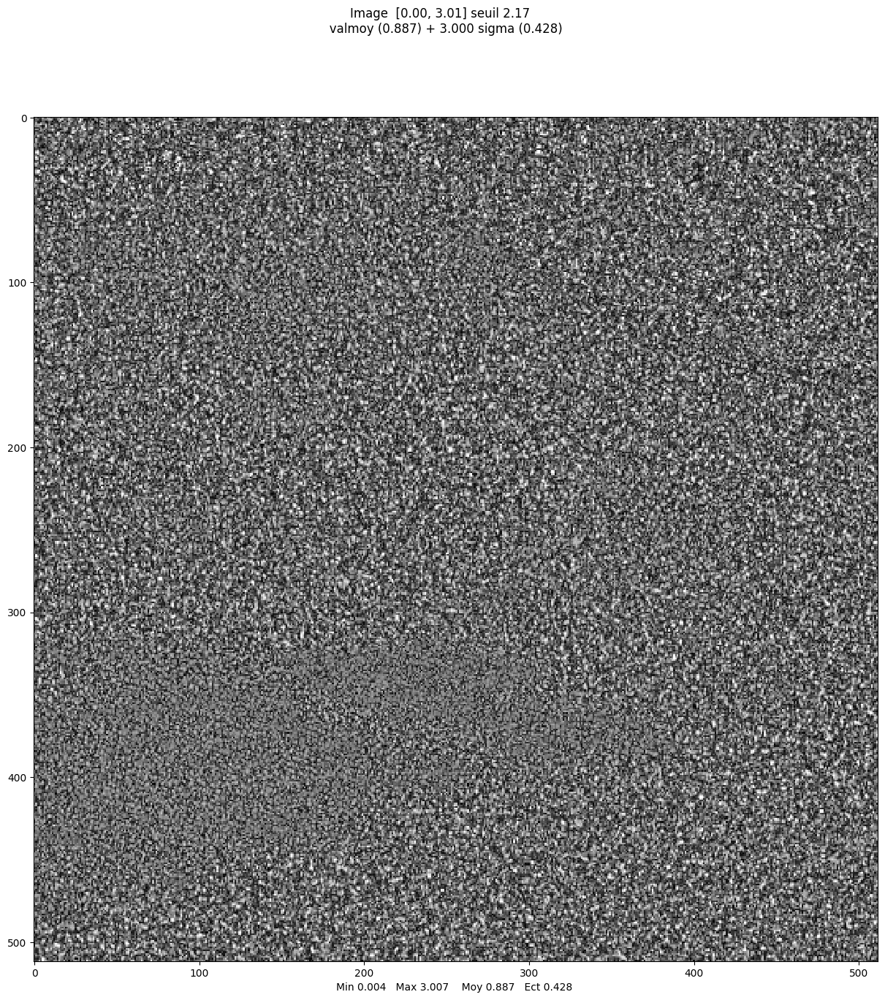

MULTI-TEMPORAL: mean = 1.2029241429298654 and var = 1.724494388126431
LEE FILTER: mean = 0.9368767018726547 and var = 0.6666307984398354
SAR2SAR: mean = 0.9697834638584214 and var = 0.7457658171745044


In [55]:
# Residual noise of multitemporal despeckling
res_noise_temp = lely_int_t0 / lely_int_multitemp #complete
mvalab.visusar(np.sqrt(res_noise_temp))
mean_temp = np.mean(res_noise_temp)
var_temp = np.var(res_noise_temp)

# Residual noise of Lee filtering
res_noise_lee = lely_int_t0 / lee_filtered_lely_int_t0 #complete
mvalab.visusar(np.sqrt(res_noise_lee))
mean_lee = np.mean(res_noise_lee)
var_lee = np.var(res_noise_lee)

# Residual noise of SAR2SAR
den_sar2sar_int = amp_den_sar2sar**2
res_noise_deep = lely_int_t0 / den_sar2sar_int #complete
mvalab.visusar(np.sqrt(res_noise_deep))
mean_deep = np.mean(res_noise_deep)
var_deep = np.var(res_noise_deep)

print('MULTI-TEMPORAL: mean = '+str(mean_temp)+' and var = '+str(var_temp))
print('LEE FILTER: mean = '+str(mean_lee)+' and var = '+str(var_lee))
print('SAR2SAR: mean = '+str(mean_deep)+' and var = '+str(var_deep))